<img src="https://3a2vzv37nkuw3esf6a3u2t7s-wpengine.netdna-ssl.com/webcentral/wp-content/uploads/sites/267/2019/02/horizontaldarkbackground.jpg" width="55%" align="left"> 
<br><br><br><br><br>
<font size=3 color='#08088A'>
<b>CSCI250 Python Computing: Building a Sensor System</b> <br><br>
Capstone final report
</font>
<hr style="height:5px" width="55%" align="left">

# Rasberry Pi Guitar Tuner

# Group 

List all members and indicate specific project responsibilities:

* Mia Jungman, Tasks: Programming lead
* Aria Ingle, Tasks: circuit design 
* Kevin Collins, Tasks: Fourier research

# Description

Our project is a guitar tuner. Using the input buttons, the user can choose which string they are going to tune. The frequency of their untuned strum is commpared against the frequency of that string when tuned. The feedback system gives the user auditory and visual cues to help them correctly tune their instrument.

# Hardware

List the hardware elements used and their function in the project. Include pictures where appropriate.
We used the following hardware components in this project.
* microphone: audio port
* microphone: gate port
* ADC
* Push buttons (6x)
* LEDs (3x)
* output buzzwe

# Operation

To begin tuning your guitar, the user must clip the microphone sensor into the guitar's sound hole. Next, start the program by restarting and running all in the kernel. Then, the user can select which string they would like to tune by using the push buttons (labeled EADGBe). Once a button is pressed, the program will wait until a sound is detected. Strum the string and wait 5 seconds for the data to be collected from the audio sensor. The program will compute the frequency of the user's strum and compare it against the tuned frequency of that string. 

If too sharp the blue LED will light, if too flat, the red LED will light, and if the user's strum is within range of the accepted frequency, the green LED will turn on. In addition to the LEDs, the buzzer will also output the correct frequency to help the user with their next attempt.

# Data

As stated in the capstone guidelines notebook, your project must have 4 data components:

1. **Collect** we collected data from the audio sensor. We visualized our audio array initially in our Data_collection function to ensure the data looked how we expected it to.
2. **Process** We then processed this array of data into our fourier function where we found the most prevalent frequencies of the guitar string audio
3. **Display** We displayed this data in print statements for our user to look at while attempting to tune their guitar. The program will display the maximum frequency that we found through fourier analysis as well as the accepted frequency of the string. 
4. **Interpret** This data is interpreted by our output system. With a series of If/Else statements, the program compares the accepted frequencies to the input frequencies. Using the comparison, the feedback system will turn on either the red, blue or green LED light.

The data we collected was raw voltage from the audio sensor which we used to comput the fourier transform. 



# Wiring

Our project was wired as seperate circuits that performed different functions (shown in pic). We used two breadboards to make our feedback system more visable to the user. The feed back system was included on the rightmost breadboard. The feedback system was comprised of an output buzzer and green, blue, and red LEDs. The LEDs were each connected to the outside vertical wire via a 1kohm resistor which was then jumped to ground. The LEDs and buzzer were each connected to their respecitve GPIO ports. 

The input system of our design included 6 push buttons (labeled EADGBe), and the microphone sensor. The buttons were each connected to their respective GPIO ports. The buttons were jumped to ground using conductive staples for a cleaner look. We wired the ADC to be device 0 and the mircophone port to be on channel 0 as well. The microphone was connected to our circuit with 3 sets of M/F wires so it could be attached to the sound hole of the guitar. The gate pin was connected to its GPIO pin. 

![Alt Text](circuit.png)

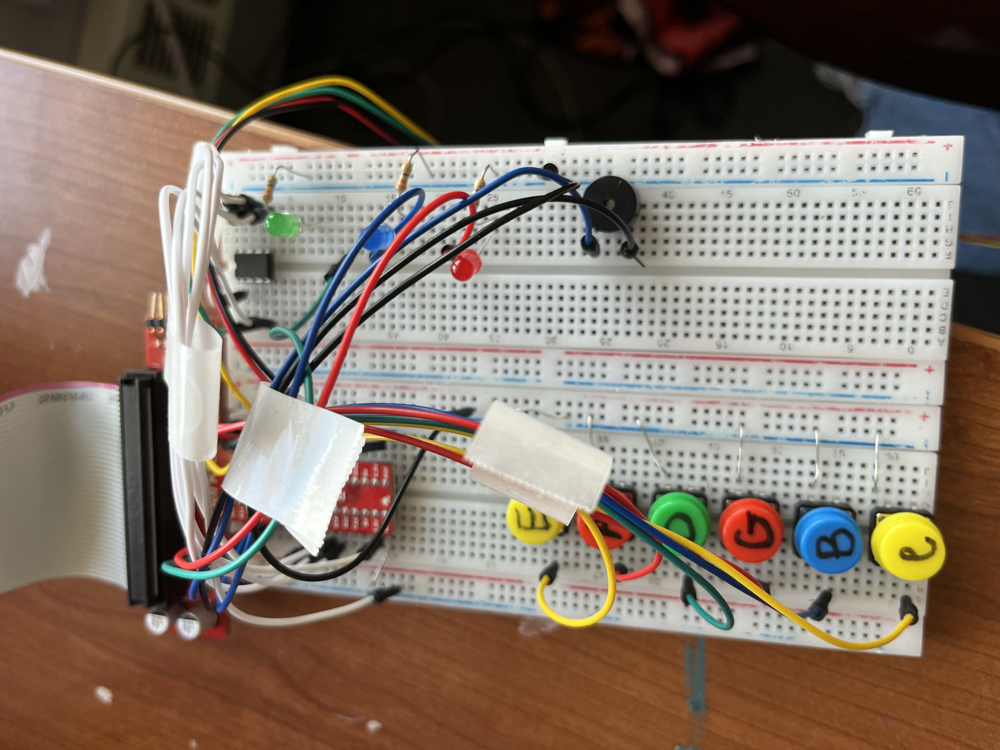

Above is our complete circuit. We tapped wires from different components of the design together so we could more easily see the different modules of this design

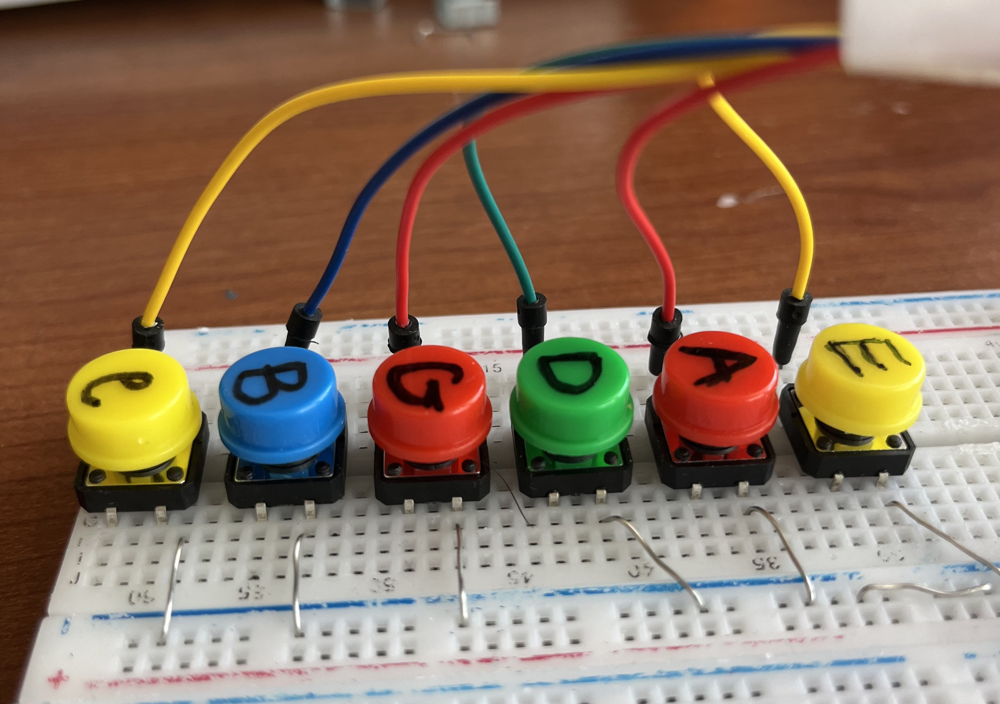

Above is the input button circuit of our design. Each button was wired to a GPIO port for power and connected to ground using staples. Our buttons were wired to be in the up/down form. Note: In this picture the high E is incorrectly wired but that was resolved after taking this picture.

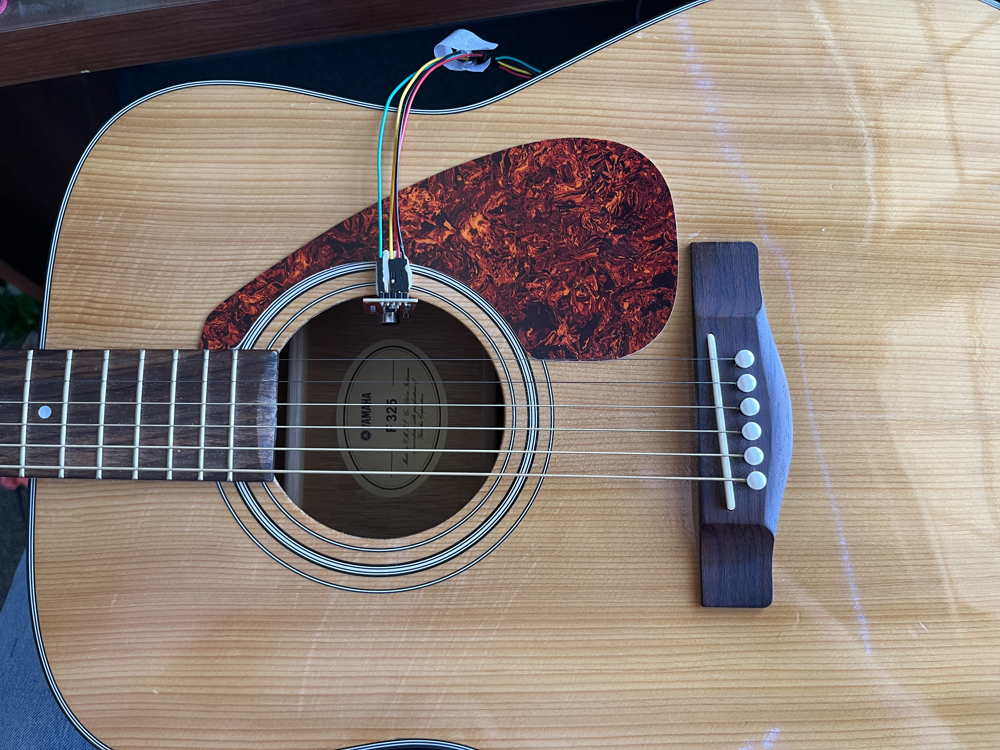

Above is a picture that shows how our microphone was attached to the sound hole of the guitar. We used sticky tack to keep it in place when tuning the instrument.

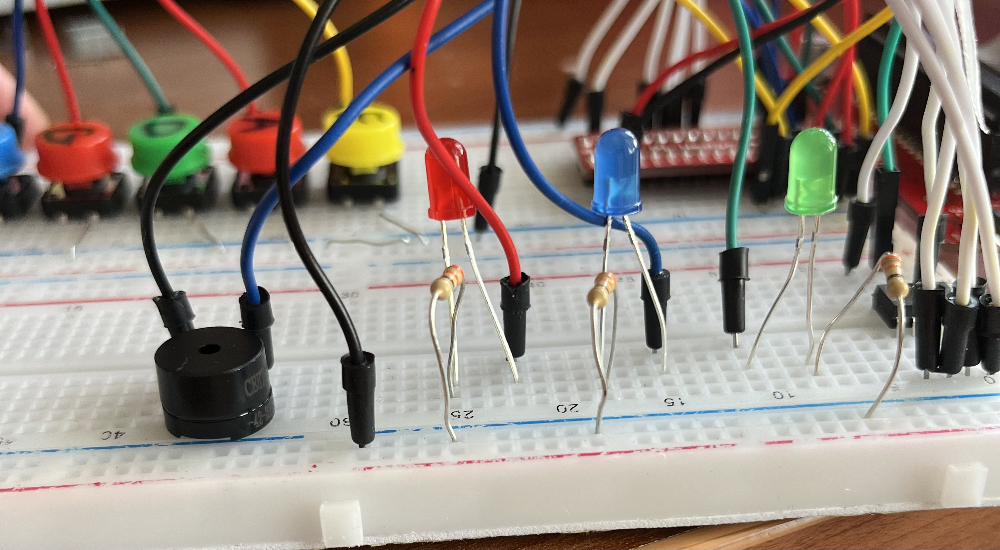

Above is a picture of the feedback system of our design. Each LED was jumped to the same wire via their resistors and then from there jumped to ground. The output buzzer was wired more individualily. The output system was not crucial to the success of this project because the program gave the user suffient feedback. However, we still included it in our design so the user would not be stuck staring at the program if they did not want to.

# Code

In [ ]:
#import libraries for calculations/visualizations
import numpy as np
from scipy.fft import fft, fftfreq
import time
import matplotlib.pyplot as plt

# import pigpio library
!sudo pigpiod -p 8887
import pigpio
pi = pigpio.pi(port = 8887)

#adc imports
import adcUtil as adc

# import the GPIO library
import RPi.GPIO as GPIO

In the cell above we import all the libraries that are used in this program. 

In [ ]:
# use GPIO numbering
GPIO.setmode(GPIO.BCM)

#set up buttons
E_button = 18
A_button = 19
D_button = 20
G_button = 21
B_button = 22
e_button = 23
GPIO.setup(E_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)
GPIO.setup(A_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)
GPIO.setup(D_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)
GPIO.setup(G_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)
GPIO.setup(B_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)
GPIO.setup(e_button, GPIO.IN, pull_up_down = GPIO.PUD_UP)

#initally off
GPIO.output(red_led,False)
GPIO.output(green_led,False)
GPIO.output(blue_led,False)

# set the GPIO pin to output mode
red_led = 16
green_led = 17
blue_led = 12
GPIO.setup(red_led, GPIO.OUT)
GPIO.setup(green_led, GPIO.OUT)
GPIO.setup(blue_led, GPIO.OUT)

#buzzer
buzz_pin = 13
duty = 0.25   # [ ]  duty cycle
duration = 2  # [s]  duration

#microphone
gate_pin = 24
GPIO.setup(gate_pin, GPIO.IN)

In the cell above we set up all the GPIO ports we use in the project. The buttons, microphone, and LEDS are set up as input/output devices. Inital conditions for the output buzzer are also defined

In [ ]:
def data_collection():
    
    print('Recording...')
    
    # make array to store raw signal
    signal_arr = np.array([])
    # record audio for a short amount of time
    to = time.time()
    
    while time.time() - to < 5: # loop for 3s

        audio = adc.readADC(channel=0, device=0)
        signal_arr = np.append(signal_arr, audio)
    
    length = np.arange(0, len(signal_arr))   
    plt.figure(figsize=(15,5))
    plt.plot(length, signal_arr)
    plt.show
    
    return signal_arr

The cell above is a function that is called in the main function. This function collects data from the microphone audio port for 5 seconds and appends the readings to the returned signal array. The raw data from the strum is visualized using matplotlib

In [ ]:
def fourier(signal_arr, string_freq):
    print('computing frequency...')
    
    # compute Fourier transform of 1D array
    nf = int(len(signal_arr) / 2+1)
    of = 0
    nt = len(signal_arr)
    sampling_rate = len(signal_arr) / 5
    dt = 1 / sampling_rate
    
    df = 1.0/(nt*dt)
    f = np.arange(of,of+nf*df,df)
    
    y = fft(signal_arr) / nf
    
    plt.figure(figsize=(15,5))
    plt.plot(f,np.imag(y[0:nf]),'b')
    plt.xlabel('f[Hz]')
    plt.title('imag')
    plt.grid()
    plt.show()
    
    max_idx = np.argmax(np.imag(y[0:nf]))
    max_freq = f[max_idx]
    print("recorded frequency:", max_freq, "; accurate frequency:", string_freq)
    return max_freq

The function above computes the fouier transform of the signal array collected in the data collection function. The imaginary component of the transform refers to which frequencies were most prevelant in the data. The frequency with the highest amplitude is returned as the frequency of the string.

In [ ]:
def tuning(string_freq):
    

    while True:
        
        #make sure all pins are off
        GPIO.output(red_led,False)
        GPIO.output(green_led,False)
        GPIO.output(blue_led,False)

        #if binary audio is detected
        if GPIO.input(gate_pin) == 1:
            print('audio detected')    

            #data collection graph
            signal_arr = data_collection()

            #call fouier transform function
            max_freq = fourier(signal_arr, string_freq)

            #set tolerance value
            tolerance = 3

            # Compare the max frequency to the correct frequency
            if abs(max_freq - string_freq) < tolerance:

                # Green LED lights up
                GPIO.output(green_led, True)                

            #if it is out of range, too sharp or too flat
            elif abs(max_freq-string_freq) > tolerance:

                #too sharp
                if max_freq - string_freq > 0:
                    print('too sharp')

                    # Blue LED lights up
                    GPIO.output(blue_led, True)

                #too flat
                elif max_freq - string_freq < 0:
                    print('too flat')

                    # Red LED lights up
                    GPIO.output(red_led, True)

            # Buzzer plays correct frequency
            pi.hardware_PWM(buzz_pin, int(string_freq), int(duty * 1e6))
            time.sleep(duration)

            # turn the buzzer off
            pi.hardware_PWM(buzz_pin, 0, 0);

            break

        time.sleep(0.01)


The function above is the main function of the program. The loop starts once the gate pin detects sound from the guitar. The data collection function is then called to obtain the raw data. The raw data is then put into the fouier function along with the correct frequency for the print statement that compares the collected frequency to the correct frequency. The returned max_freq variable is compared against the correct frequency of each string in a series of If/Else statements. There is a tolerance range of 3 Hz to be deemed correctly tuned. 

If the string is within the tolerance range, the string is correctly tuned and the green Led will light up. If the string is not within the tolerance range and postive, the blue led will turn on, indicating that the frequency was too sharp. If the string is not within the tolerance range and negative, the red led will turn on, indicating that the frequency was too flat. 

The output buzzer will play the correct frequency of a tuned string as an auditory clue and for futher tweaking, even if the max_freq was in the tolerance range

In [ ]:
while True:
    
    if GPIO.input(E_button) == 0:
        print('running')
        tuning(82.41)
        
    elif GPIO.input(A_button) == 0:
        print('running')
        tuning(110.00)
    
    elif GPIO.input(D_button) == 0:
        print('running')
        tuning(146.83)
    
    elif GPIO.input(G_button) == 0:
        print('running')
        tuning(196.00)
    
    elif GPIO.input(B_button) == 0:
        print('running')
        tuning(246.94)
    
    elif GPIO.input(e_button) == 0:
        print('running')
        tuning(329.63)

the code above is what runs the program and how the user uses the program. It loops forever. The tuning function is entered when one of the six buttons are pressed. The argument for the tuning function is the accepted frequency of each string when correctly tuned. To stop the program, unplug the Pi or pause the kernel.

In [ ]:
GPIO.cleanup()

# Credits
To help us understand the scripty fourier transform functions, Dr.Romig sent us a notebook example by Paul Sava. 